# preparing

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly
import functions
from preprocess_dataframe import get_preprocess_dataframe
import os
import re
import glob
import math
import plotly.graph_objs as go
from shutil import copyfile
import time

## prepare paths

In [6]:
cycle_test=25

In [7]:
times=150

In [8]:
main_path='/media/alena/ext_space/job_analyze'
disabled_path="{}/disabled_folder{}".format(main_path,cycle_test)
frozen_path='{}/frozen_folder{}'.format(main_path,cycle_test)
learn_path='{}/learn_folder{}'.format(main_path,cycle_test)

## prepare func import dataframes

In [9]:
def readcsv(args):
    return pd.read_csv(args, header=None)

def get_df(path_folder,mode,times):
    
    df_ex_pl_time = pd.DataFrame()
    df_ex_pl_time_orig = pd.DataFrame()
    df_explains_plans = pd.DataFrame()
    df_query_err=pd.DataFrame()
    df_query_stat=pd.DataFrame()
    df_query_data=pd.DataFrame()
    filename_basics=glob.glob("{}/*_report.csv".format(path_folder, mode))
    if mode !='disabled':
        filename_others=['{}/{}_aqo_data.csv'.format(path_folder,mode), '{}/{}_aqo_query_stat.csv'.format(path_folder,mode)] 
        dfs = [df_query_data,df_query_err, df_query_stat]
    
    #print(filename_basics)
    for file in filename_basics:
        df_list = list(pd.read_csv(file) for file in filename_basics)
        if len(df_list)>1:
            df_list = []
            for file in filename_basics:
                df=pd.read_csv(file)
                df['Query hash'] = df['Query hash'].astype(str)
                df_list.append(df)
            df_ex_pl_time = pd.concat(df_list, ignore_index=True)
        else:
            df_ex_pl_time = df_list[0]
    if mode !='disabled':
        for k,file in enumerate(filename_others):
            dfs[k] = pd.read_csv(file)
    
    #explains
    dict_q={}
    dict_q_text={}
    lst=[]
    q=''
    plan=''
    k=0
    with open('{}/explains.txt'.format(path_folder)) as f:
        for line in f:
            str_=line
            if str_.replace(' ','')=='':
                continue
            if str_.find("QUERY PLAN")==0:
                if q not in list(dict_q.keys()):
                    dict_q[q]=1
                    dict_q_text[q]=[]
                    dict_q_text[q].append(re.sub(r'<b>\((.+)\)</b>', r'<b>\1</b>', str_))
                    #dict_q[q].append(str_)
                else:
                    str_=re.sub(r'<b>\((.+)\)</b>', r'<b>\1</b>', str_)
                    for i in list(dict_q_text[q]):
                        if i==str_:
                            dict_q[q]+=1
                            dict_q_text[q].append(str_)
                            break
                    #dict_q[q].append(str_)
                q=''
            else:
                q+=str_
    
    df_explains_plans = pd.DataFrame(dict_q.items())
    df_explains_plans.columns=['query_string', 'plans']
    #lst=[]
    #for i in df_explains_plans.itertuples(index=False):
    #    lst.append(len(i.plans)>1)
    #df_explains_plans['changed']=lst

    #report
    df_ex_pl_time = df_ex_pl_time.fillna(0)
    print(df_ex_pl_time)
    df_ex_pl_time = df_ex_pl_time.rename(columns = {'Plan time': 'plan_time',
                                         'Query Number':'query_number', 
                                         'Query Name':'query_name', 
                                         'Execution Time':'execution_time', 
                                         'Query hash':'query_hash'})
    df_ex_pl_time['query_number'] = df_ex_pl_time['query_number'].astype(int)
    df_ex_pl_time['query_hash'] = df_ex_pl_time['query_hash'].astype(str)
    df_ex_pl_time['plan_time'] = df_ex_pl_time['plan_time'].astype(float)
    df_ex_pl_time_orig=df_ex_pl_time.copy()
    if times>1:
        lst_data = []
        dict_query = {}
        for i in df_ex_pl_time.itertuples(index=False):
            if i.query_name in dict_query:
                dict_query[i.query_name][1] += i.execution_time
                dict_query[i.query_name][3] += i.plan_time
            else:
                dict_query[i.query_name] = [i.query_name, i.execution_time, i.query_hash, i.plan_time]
        df_ex_pl_time = pd.DataFrame(dict_query.values(), columns = ['query_name', 'execution_time', 'query_hash', 'plan_time'])
        df_ex_pl_time['exec_time_avg'] = df_ex_pl_time['execution_time']/times
        df_ex_pl_time['plan_time_avg'] = df_ex_pl_time['plan_time']/times
    
    if mode !='disabled':
        #err
        filename_basics=glob.glob("{}/*_err*.csv".format(path_folder, mode))
        lst=[]
        df_list=[]
        def f(lst,k,l):
            lst_temp=[k]*l
            lst = lst+lst_temp
        #for file in filename_basics:
            #for iteration,file in enumerate(filename_basics):
            #    df_list.append(pd.read_csv(file))
            #    lst_temp=[iteration]*len(df_list)
            #    lst = lst+lst_temp
        df_list = list(pd.read_csv(file) for file in filename_basics)
        if len(df_list)>1:
            df_query_err = pd.concat(df_list, ignore_index=True)
        else:
            df_query_err = df_list[0]
        #df_list['iteration']=lst
        #print(df_query_err.columns)
        df_query_err['id'] = df_query_err['id'].astype(str)
        df_query_err['errdelta'] = df_query_err['errdelta'].astype(float)
    
        #stat
        df_query_stat=dfs[1].fillna(0)
        lst_stat_columns = ['execution_time_with_aqo', 'execution_time_without_aqo',
           'planning_time_with_aqo', 'planning_time_without_aqo',
           'cardinality_error_with_aqo', 'cardinality_error_without_aqo']
        lst_stat_cut = [1, 1, 1, 1, 1, 1]
        df_query_stat = get_preprocess_dataframe(df_query_stat, lst_stat_columns, lst_stat_cut)
        lst_min_val_with_aqo = []
        lst_min_iter_with_aqo = []
        for i in df_query_stat.itertuples(index=False):
            min_val = 100000
            iteration = -1
            for k,val in enumerate(i.cardinality_error_with_aqo_split):
                if val < 0.1:
                    if min_val>val:
                        min_val = val
                        iteration = k
                    break
            lst_min_val_with_aqo.append(min_val)
            lst_min_iter_with_aqo.append(iteration)
        df_query_stat['min_iter_card_with'] = lst_min_iter_with_aqo
        df_query_stat['lst_min_val_with_aqo'] = lst_min_val_with_aqo
        

        lst_min_val_without_aqo = []
        lst_min_iter_without_aqo = []
        for i in df_query_stat.itertuples(index=False):
            min_val = 100000
            iteration = -1
            for k,val in enumerate(i.cardinality_error_without_aqo_split):
                if min_val > val:
                    min_val = val
                    iteration = k
            lst_min_val_without_aqo.append(min_val)
            lst_min_iter_without_aqo.append(iteration)
        df_query_stat['min_iter_card_without'] = lst_min_iter_without_aqo
        df_query_stat['lst_min_val_without_aqo'] = lst_min_val_without_aqo

        lst_min_val_with_aqo = []
        lst_min_iter_with_aqo = []
        for i in df_query_stat.itertuples(index=False):
            min_val = 100000
            iteration = -1
            for k,val in enumerate(i.execution_time_with_aqo_split):
                if min_val>val:
                    min_val = val
                    iteration = k
            lst_min_val_with_aqo.append(min_val)
            lst_min_iter_with_aqo.append(iteration)
        df_query_stat['min_iter_exec_with'] = lst_min_iter_with_aqo
        df_query_stat['lst_min_exec_with_aqo'] = lst_min_val_with_aqo

        lst_columns = ['cardinality_error_without_aqo_split', 'cardinality_error_with_aqo_split']
        lst_columns_with = ['planning_time_with_aqo_split', 'execution_time_with_aqo_split']
        lst_columns_without = ['planning_time_without_aqo_split', 'execution_time_without_aqo_split']
        for i,j,k in zip(lst_columns, lst_columns_with, lst_columns_without):
            df_query_stat = functions.last_errors(df_query_stat, i, '{}_last_value'.format(i))
            df_query_stat = functions.last_errors(df_query_stat, j,'{}_last_value'.format(i))
            df_query_stat = functions.last_errors(df_query_stat, k,'{}_last_value'.format(i))
        
        dict_hash = {}
        for i in df_ex_pl_time.itertuples(index=False):
            if i.query_hash in dict_hash:
                dict_hash[str(i.query_hash)].append(i.query_name)
            else:
                dict_hash[i.query_hash] = []
                dict_hash[str(i.query_hash)].append(i.query_name)
        df_temp=pd.DataFrame(dict_hash.items())
        df_temp.columns=['queryid', 'query_name']
        df_temp['queryid'] = df_temp['queryid'].astype(str)
        df_query_stat['queryid'] = df_query_stat['queryid'].astype(str)
        #print(df_query_stat.columns)
        df_query_stat=df_query_stat.merge(df_temp, how='left', on='queryid')
        df_query_err=df_query_err.merge(df_temp,left_on='id', right_on='queryid')
        df_query_err['query_name'] = df_query_err['query_name'].astype(str)
        df_query_stat['query_name'] = df_query_stat['query_name'].astype(str)
        df_query_err=df_query_err.drop(columns=['queryid'])
    
    if mode !='disabled':
        return df_explains_plans, df_ex_pl_time, df_ex_pl_time_orig, df_query_err, df_query_stat
    else:
        return df_explains_plans, df_ex_pl_time

In [10]:
df_t=pd.read_csv('{}/frozen_aqo_query_stat.csv'.format(frozen_path))

In [11]:
len(df_t['execution_time_with_aqo'][0][1:-1].split(','))

49

In [12]:
learn_df_explains_plans, learn_df_ex_pl_time, learn_df_ex_pl_time_orig, learn_df_query_err, learn_df_query_stat=get_df(learn_path,'learn',times)

      Query Number Query Name  Execution Time  Plan time            Query hash
0                1    27c.sql         189.890   2661.185  -1723239386245354632
1                1    32a.sql          42.826     15.321   6225652705960457954
2                1    32b.sql        1597.683     18.714   6225652705960457954
3                5    32a.sql          35.138     16.931   6225652705960457954
4                5    32b.sql         319.304     19.463   6225652705960457954
...            ...        ...             ...        ...                   ...
5807            23     8d.sql        7759.459     26.839  -2444720784039749802
5808            23     9a.sql        1337.509     57.403  -6747521538659772949
5809            23     9b.sql        1294.877     72.979    316739818532851506
5810            23     9c.sql        2317.832     47.160   -180252288200201541
5811            23     9d.sql       10571.459     49.309   7221379846823333251

[5812 rows x 5 columns]


/home/alena/job_analyze1/aqo_analyze/functions.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['{}_split'.format('{}'.format(column_name))].loc[k] = list(map(get_elements,i.split(',')))
/home/alena/job_analyze1/aqo_analyze/functions.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['{}_split'.format('{}'.format(column_name))].loc[k] = list(map(get_elements,i.split(',')))
/home/alena/job_analyze1/aqo_analyze/functions.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

In [13]:
#learn_df_ex_pl_time_orig.to_csv('learn_df_ex_pl_time_orig.csv'), learn_df_query_err.to_csv('learn_df_query_err.csv'), 
#learn_df_query_stat.to_csv('learn_df_query_stat.csv'),learn_df_explains_plans.to_csv('learn_df_explains_plans.csv'),
#learn_df_ex_pl_time.to_csv('learn_df_ex_pl_time.csv')

In [14]:
len(learn_df_query_stat['cardinality_error_with_aqo_split'].to_list()[0])

49

In [15]:
disabled_df_explains_plans, disabled_df_ex_pl_time=get_df(disabled_path,'disabled',1)

      Query Number Query Name  Execution Time  Plan time            Query hash
0                7    10a.sql         751.790     26.331  -6651533820180303979
1                7    10b.sql         334.181     23.606    988535410010893112
2                7    10c.sql       22489.554     21.071   2494719406442254794
3                7    11a.sql         194.005     56.724  -8754961486292191806
4                7    11b.sql          14.037     56.639   7102013096890644952
...            ...        ...             ...        ...                   ...
1012             4     8d.sql        7849.398     16.409  -2444720784039749802
1013             4     9a.sql        5728.813     47.909  -6747521538659772949
1014             4     9b.sql        4780.772     20.522    316739818532851506
1015             4     9c.sql        6111.648     45.871   -180252288200201541
1016             4     9d.sql       15654.495     22.264   7221379846823333251

[1017 rows x 5 columns]


In [16]:
frozen_df_explains_plans, frozen_df_ex_pl_time, frozen_df_ex_pl_time_orig, frozen_df_query_err, frozen_df_query_stat=get_df(frozen_path,'frozen',1)

     Query Number Query Name  Execution Time  Plan time           Query hash
0               1    10a.sql        5739.607     34.430 -6651533820180303979
1               1    10b.sql         281.868     43.372   988535410010893112
2               1    10c.sql       80204.748     16.622  2494719406442254794
3               1    11a.sql         317.093     42.445 -8754961486292191806
4               1    11b.sql          27.027     69.295  7102013096890644952
..            ...        ...             ...        ...                  ...
108             1     8d.sql        7857.846     46.430 -2444720784039749802
109             1     9a.sql        1422.215     53.855 -6747521538659772949
110             1     9b.sql        1304.461     79.411   316739818532851506
111             1     9c.sql        6884.962     42.334  -180252288200201541
112             1     9d.sql       11037.984     48.470  7221379846823333251

[113 rows x 5 columns]


/home/alena/job_analyze1/aqo_analyze/functions.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['{}_split'.format('{}'.format(column_name))].loc[k] = list(map(get_elements,i.split(',')))
/home/alena/job_analyze1/aqo_analyze/functions.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['{}_split'.format('{}'.format(column_name))].loc[k] = list(map(get_elements,i.split(',')))
/home/alena/job_analyze1/aqo_analyze/functions.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

In [17]:
frozen_df_ex_pl_time

,query_number,query_name,execution_time,plan_time,query_hash
0,1,10a.sql,5739.607,34.430,-6651533820180303979
1,1,10b.sql,281.868,43.372,988535410010893112
2,1,10c.sql,80204.748,16.622,2494719406442254794
3,1,11a.sql,317.093,42.445,-8754961486292191806
4,1,11b.sql,27.027,69.295,7102013096890644952
...,...,...,...,...,...
108,1,8d.sql,7857.846,46.430,-2444720784039749802
109,1,9a.sql,1422.215,53.855,-6747521538659772949
110,1,9b.sql,1304.461,79.411,316739818532851506
111,1,9c.sql,6884.962,42.334,-180252288200201541


In [18]:
frozen_df_ex_pl_time[frozen_df_ex_pl_time['query_name']=='32a.sql']

,query_number,query_name,execution_time,plan_time,query_hash
82,1,32a.sql,23.802,12.393,6225652705960457954


## Main report analyze

In [19]:
frozen_df_ex_pl_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113 entries, 0 to 112
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   query_number    113 non-null    int64  
 1   query_name      113 non-null    object 
 2   execution_time  113 non-null    float64
 3   plan_time       113 non-null    float64
 4   query_hash      113 non-null    object 
dtypes: float64(2), int64(1), object(2)
memory usage: 4.5+ KB


In [20]:
# frozen_df_ex_pl_time, frozen_df_ex_pl_time, frozen_df_query_err, frozen_df_query_stat

In [21]:
def renames(df, mode):
    df = df.rename(columns = {'plan_time':'plan_time_{}'.format(mode), 'execution_time':'execution_time_{}'.format(mode)})
    if mode == 'control' or mode == 'disabled':
        df = df.rename(columns = {'plan_time_avg':'plan_time_avg_{}'.format(mode), 'exec_time_avg':'exec_time_avg_{}'.format(mode)})
    return df

In [22]:
frozen_df_ex_pl_time=renames(frozen_df_ex_pl_time,'frozen')


In [23]:
disabled_df_ex_pl_time=renames(disabled_df_ex_pl_time,'disabled')

In [24]:
learn_df_ex_pl_time=renames(learn_df_ex_pl_time,'learn')

In [25]:
disabled_df_ex_pl_time

,query_number,query_name,execution_time_disabled,plan_time_disabled,query_hash
0,7,10a.sql,751.790,26.331,-6651533820180303979
1,7,10b.sql,334.181,23.606,988535410010893112
2,7,10c.sql,22489.554,21.071,2494719406442254794
3,7,11a.sql,194.005,56.724,-8754961486292191806
4,7,11b.sql,14.037,56.639,7102013096890644952
...,...,...,...,...,...
1012,4,8d.sql,7849.398,16.409,-2444720784039749802
1013,4,9a.sql,5728.813,47.909,-6747521538659772949
1014,4,9b.sql,4780.772,20.522,316739818532851506
1015,4,9c.sql,6111.648,45.871,-180252288200201541


In [26]:
df_ex_pl_time = frozen_df_ex_pl_time.merge(disabled_df_ex_pl_time, how='left', on=['query_name','query_number','query_hash'])

In [27]:
#df = df.merge(learn_df_ex_pl_time, how='left', on=['query_name','query_hash'])

In [28]:
df_ex_pl_time

,query_number,query_name,execution_time_frozen,plan_time_frozen,query_hash,execution_time_disabled,plan_time_disabled
0,1,10a.sql,5739.607,34.430,-6651533820180303979,12515.929,23.968
1,1,10b.sql,281.868,43.372,988535410010893112,310.061,25.780
2,1,10c.sql,80204.748,16.622,2494719406442254794,25627.590,23.937
3,1,11a.sql,317.093,42.445,-8754961486292191806,682.167,37.589
4,1,11b.sql,27.027,69.295,7102013096890644952,24.560,56.855
...,...,...,...,...,...,...,...
108,1,8d.sql,7857.846,46.430,-2444720784039749802,7877.138,34.873
109,1,9a.sql,1422.215,53.855,-6747521538659772949,6187.815,47.346
110,1,9b.sql,1304.461,79.411,316739818532851506,4996.767,20.679
111,1,9c.sql,6884.962,42.334,-180252288200201541,6290.517,50.426


In [29]:
learn_df_ex_pl_time_orig

,query_number,query_name,execution_time,plan_time,query_hash
0,1,27c.sql,189.890,2661.185,-1723239386245354632
1,1,32a.sql,42.826,15.321,6225652705960457954
2,1,32b.sql,1597.683,18.714,6225652705960457954
3,5,32a.sql,35.138,16.931,6225652705960457954
4,5,32b.sql,319.304,19.463,6225652705960457954
...,...,...,...,...,...
5807,23,8d.sql,7759.459,26.839,-2444720784039749802
5808,23,9a.sql,1337.509,57.403,-6747521538659772949
5809,23,9b.sql,1294.877,72.979,316739818532851506
5810,23,9c.sql,2317.832,47.160,-180252288200201541


## err_data

In [30]:
frozen_df_query_err

,id,errdelta,query_name
0,-9026514954839072455,2.334167,['12a.sql']
1,-8754961486292191806,2.954876,['11a.sql']
2,-7994933085961275538,1.404576,['23b.sql']
3,-7971004576533452411,3.230694,['21c.sql']
4,-7678011977838348522,3.357340,['7c.sql']
...,...,...,...
93,7721649514993682563,2.212128,['30b.sql']
94,7915967579038312663,2.273007,['19d.sql']
95,8031722090065659855,0.650690,['3c.sql']
96,9105500078934324812,4.354765,['25c.sql']


In [31]:
def renames(df, mode, column):
    df = df.rename(columns = {column:'{}_{}'.format(column,mode)})
    return df

In [32]:
learn_df_query_err=renames(learn_df_query_err,'learn','errdelta')

In [33]:
frozen_df_query_err=renames(frozen_df_query_err,'frozen','errdelta')

In [34]:
df_err = learn_df_query_err.merge(frozen_df_query_err, how='left', on=['id', 'query_name'])

In [35]:
df_err

,id,errdelta_learn,query_name,errdelta_frozen
0,988535410010893112,0.000000,['10b.sql'],1.454403
1,988535410010893112,0.000000,['10b.sql'],1.454403
2,988535410010893112,0.000000,['10b.sql'],1.454403
3,988535410010893112,0.000000,['10b.sql'],1.454403
4,988535410010893112,0.000000,['10b.sql'],1.454403
...,...,...,...,...
14695,-1950505845315524548,0.016898,"['4a.sql', '4b.sql', '4c.sql']",1.337981
14696,-1950505845315524548,0.016898,"['4a.sql', '4b.sql', '4c.sql']",1.337981
14697,-1950505845315524548,0.016898,"['4a.sql', '4b.sql', '4c.sql']",1.337981
14698,-1950505845315524548,0.016898,"['4a.sql', '4b.sql', '4c.sql']",1.337981


## learn_df_query_stat

In [36]:
learn_df_query_stat.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 98 entries, 0 to 97
Data columns (total 18 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   queryid                                         98 non-null     object 
 1   cardinality_error_without_aqo_split             98 non-null     object 
 2   cardinality_error_with_aqo_split                98 non-null     object 
 3   planning_time_without_aqo_split                 98 non-null     object 
 4   planning_time_with_aqo_split                    98 non-null     object 
 5   execution_time_without_aqo_split                98 non-null     object 
 6   execution_time_with_aqo_split                   98 non-null     object 
 7   executions_with_aqo                             98 non-null     int64  
 8   executions_without_aqo                          98 non-null     int64  
 9   min_iter_card_with                           

In [37]:
learn_df_query_stat

,queryid,cardinality_error_without_aqo_split,cardinality_error_with_aqo_split,planning_time_without_aqo_split,planning_time_with_aqo_split,execution_time_without_aqo_split,execution_time_with_aqo_split,executions_with_aqo,executions_without_aqo,min_iter_card_with,lst_min_val_with_aqo,min_iter_card_without,lst_min_val_without_aqo,min_iter_exec_with,lst_min_exec_with_aqo,cardinality_error_without_aqo_split_last_value,cardinality_error_with_aqo_split_last_value,query_name
0,988535410010893112,"[1.4544034477867618, 1.4544034477867618, 1.454...","[1.589973486148456, 0.727611364060822, 0.0, 0....","[0.025642874, 0.007828251, 0.007758359, 0.0180...","[0.017577158, 0.044598921, 0.018018695, 0.0433...","[0.310485094, 0.334892289, 0.326413176, 0.3317...","[0.281776855, 0.6112129, 0.299349277, 0.293912...",49,9,2,0.000000,0,1.454403,0,0.281777,0.018081,0.330344,['10b.sql']
1,-6651533820180303979,"[0.8844776888338584, 0.8844776888338584, 0.884...","[0.9000287331266309, 0.42305006092767056, 0.04...","[0.023899077, 0.008257062, 0.00845887, 0.02229...","[0.019827194, 0.04702148, 0.02135218, 0.044616...","[12.516446924, 0.668155523, 0.609842795, 0.600...","[0.607062159, 0.599211753, 0.824431644, 0.7966...",49,9,2,0.046210,0,0.884478,26,0.594172,0.021600,0.596952,['10a.sql']
2,-3414057395363075461,"[1.0767642529989756, 1.0767642529989756, 1.076...","[0.8628935301824878, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.028791295, 0.008940323, 0.027831292, 0.0285...","[0.012879719, 0.0142253, 0.013549247, 0.015543...","[0.597842259, 0.591961672, 0.713987991, 0.7211...","[0.593569656, 0.617249752, 0.732565127, 0.7201...",49,9,1,0.000000,0,1.076764,32,0.591182,0.024748,0.715362,['5b.sql']
3,3350265702090035455,"[3.6552026188381133, 3.6552026188381133, 3.655...","[3.6639264839699344, 1.937383832897206, 2.2022...","[0.048942265, 0.051050601, 0.050587957, 0.0227...","[0.037893912, 0.045696331, 0.050339146, 0.0719...","[59.421560735, 50.133694658, 47.616464688, 47....","[47.449965547, 70.583751342, 107.359761153, 12...",49,9,5,0.017763,0,3.655203,28,13.189103,0.027337,48.001990,['16b.sql']
4,-917204397272063480,"[3.6157051183819533, 3.6157051183819533, 3.615...","[3.606388657002926, 1.6827075686740898, 2.1315...","[0.040337577, 0.037975024, 0.015918892, 0.0131...","[0.022039698, 0.021682673, 0.02641667, 0.02595...","[33.636074899, 28.166503692, 28.248150426, 27....","[27.435883754, 26.467559253, 18.290081777, 64....",49,9,5,0.081275,0,3.615705,31,5.798746,0.039688,28.400692,['17a.sql']
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93,-6885312641126422993,"[3.819879668426597, 3.819879668426597, 3.81987...","[3.819879668426597, 0.18718021769015913, 0.0, ...","[0.004396572, 0.004510598, 0.014177141, 0.0053...","[0.007569681, 0.007615437, 0.009151617, 0.0212...","[0.001249733, 0.001190761, 0.003093398, 0.0013...","[0.002374399, 0.002358579, 0.002668912, 0.0059...",49,9,2,0.000000,0,3.819880,27,0.002281,0.012026,0.002750,['1d.sql']
94,-1889760809355916724,"[3.9272739392697336, 3.9272739392697336, 3.927...","[3.910810846905473, 2.1951090606911117, 2.7125...","[0.193982473, 0.230929176, 0.211500655, 0.2282...","[2.666428664, 2.607708063, 2.83595837, 2.57391...","[4.587836717, 4.899452753, 4.62449141, 4.92777...","[4.598267096, 7.410799325, 9.135323215, 24.837...",49,9,14,0.028881,0,3.927274,22,3.495453,0.180621,4.784939,['30c.sql']
95,-6571914703387389993,"[1.3289967129940778, 1.3289967129940778, 1.328...","[1.3289967129940778, 0.9990433078810779, 1.073...","[0.293388152, 0.311018954, 0.280632229, 0.2565...","[5.557237529, 5.594520365, 5.173909056, 5.5367...","[0.039576751, 0.047210165, 0.039901473, 0.0396...","[0.050954074, 0.05278918, 0.060844245, 0.31233...",49,9,5,0.000731,0,1.328997,6,0.048943,0.311098,0.047398,['29b.sql']
96,-460740518707800565,"[1.4539886409363303, 1.4539886409363303, 1.453...","[1.4516665782319713, 0.5180599873104093, 0.517...","[0.066686751, 0.093799511, 0.090525902, 0.0925...","[0.136434555, 0.153296535, 0.112843144,

# build graphs: learning

In [38]:
def upload_pics(contain, dir_to, filename):
    plotly.offline.plot(contain, image_filename=filename, image='svg')
    time.sleep(10)
    #os.replace('{}/{}.svg'.format('/home/alena/Downloads', filename), '{}/{}.svg'.format(dir_to, filename))

## err for every query

### err_data

In [39]:
learn_df_query_err

,id,errdelta_learn,query_name
0,988535410010893112,0.000000,['10b.sql']
1,988535410010893112,0.000000,['10b.sql']
2,988535410010893112,0.000000,['10b.sql']
3,988535410010893112,0.000000,['10b.sql']
4,988535410010893112,0.000000,['10b.sql']
...,...,...,...
14695,-1950505845315524548,0.016898,"['4a.sql', '4b.sql', '4c.sql']"
14696,-1950505845315524548,0.016898,"['4a.sql', '4b.sql', '4c.sql']"
14697,-1950505845315524548,0.016898,"['4a.sql', '4b.sql', '4c.sql']"
14698,-1950505845315524548,0.016898,"['4a.sql', '4b.sql', '4c.sql']"


In [40]:
lst_queries=learn_df_query_err['id'].unique()

In [41]:
lst=[]
for k in range(times):
    lst += [k]*len(lst_queries)
    if len(lst)==len(learn_df_query_err):
        break

In [42]:
len(lst), len(learn_df_query_err)

(14700, 14700)

In [43]:
learn_df_query_err['iter']=lst

In [44]:
name_query = list(learn_df_query_err['query_name'].unique())

In [45]:
from plotly.subplots import make_subplots

In [46]:
ox=list(x for x in range(times))

In [ ]:
filter1=[
 "['27c.sql']", 
 "['32a.sql', '32b.sql']"]

Found ffmpeg: /opt/yandex/browser-beta/libffmpeg.so
	avcodec: 3877988
	avformat: 3874916
	avutil: 3744870
Ffmpeg version is OK! Let's use it.
[34366:34366:0406/101447.403866:ERROR:isolated_origin_util.cc(74)] Ignoring port number in isolated origin: chrome://custo


Opening in existing browser session.


libva error: vaGetDriverNameByIndex() failed with unknown libva error, driver_name = (null)


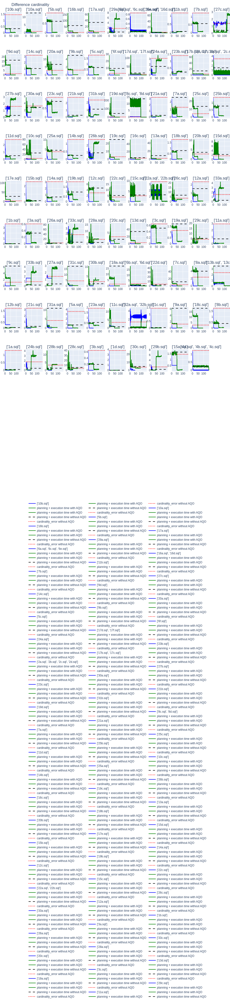

In [47]:
fig = make_subplots(rows=11, cols=11, subplot_titles=name_query)
for it, i in enumerate(name_query):
    df_temp=learn_df_query_stat[learn_df_query_stat['query_name']==i]
    if i=='nan':
        continue
    fig.add_trace(
        go.Scatter(name=i,x = ox, y = df_temp['cardinality_error_with_aqo_split'].to_list()[0][:-1],line = dict(color= 'blue', dash='solid')),
        row=(it//11)+1, col=(it%11)+1
    )
    fig.add_trace(
    go.Scatter(name='planning + execution time with AQO'.format(i),x = ox, 
               y = df_temp['execution_time_with_aqo_split'].to_list()[0][:-1]+df_temp['planning_time_with_aqo_split'].to_list()[0][:-1],line = dict(color= 'green', dash='solid')),
    row=(it//11)+1, col=(it%11)+1
)
    fig.add_trace(go.Scatter(name='cardinality_error without AQO'.format("['21a.sql']"), x = ox, 
                         y = [df_temp['cardinality_error_without_aqo_split'].to_list()[0][0]]*len(ox), line = dict(color= 'red', dash='dot')), 
              row=(it//11)+1, col=(it%11)+1)

    fig.add_trace(
        go.Scatter(name='planning + execution time with AQO'.format(i),x = ox, 
                   y = df_temp['execution_time_with_aqo_split'].to_list()[0][:-1]+df_temp['planning_time_with_aqo_split'].to_list()[0][:-1],line = dict(color= 'green', dash='solid')),
        row=(it//11)+1, col=(it%11)+1
    )
    fig.add_trace(
        go.Scatter(name='planning + execution time without AQO'.format(i),x = ox, 
                   y = [df_temp['execution_time_without_aqo_split'].to_list()[0][0]+df_temp['planning_time_without_aqo_split'].to_list()[0][0]]*len(ox),
                   line = dict(color= 'black', dash='dash')),
        row=(it//11)+1, col=(it%11)+1
    )
    #fig.update_yaxes(zeroline=True, zerolinewidth=3, zerolinecolor='red')
    #fig.add_trace(go.Scatter(x = ox, y = val_control/val_control))
    #fig.add_trace(go.Scatter(x = ox, y = val_control/val_control*2))
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                   title_text="Difference cardinality",
                  margin=dict(l=0, r=0, t=50, b=0))
fig.update_layout(width=4000, height = 4200)
upload_pics(fig, '{}/{}_folder{}'.format(main_path, 'learn',cycle_test), 'Difference cardinality')
os.rename('temp-plot.html', '{}_learn_Difference cardinality.html'.format(cycle_test))
fig.show()

### query_stats

In [2]:
#for conference

In [57]:
name_query=list(learn_df_query_stat['query_name'])

In [60]:
oy=df_temp['cardinality_error_with_aqo_split'].to_list()

In [67]:
filter1=[]
for it, i in enumerate(name_query):
    if i=='nan':
        continue
    df_temp=learn_df_query_stat[learn_df_query_stat['query_name']==i]
    if df_temp['cardinality_error_with_aqo_split'].to_list()[0][16]>0.1:
        filter1.append(i)

In [68]:
filter1=[
 "['21a.sql']",
  "['26b.sql']", 
 "['8c.sql', '8d.sql']",
 "['14a.sql']"]

In [119]:
filter1=[
 "['27c.sql']", 
 "['32a.sql', '32b.sql']",
# "['31b.sql']", #"['27a.sql']",
#"['22a.sql', '22b.sql']",
]

In [70]:
filter1=[
 "['21a.sql']",
 "['16b.sql']","['6f.sql']", "['14a.sql']", "['25c.sql']", "['24a.sql']", 
 #"['17d.sql', '17f.sql']",
    "['16a.sql', '16d.sql']",
 "['26b.sql']"]

specific queries

Found ffmpeg: /opt/yandex/browser-beta/libffmpeg.so
	avcodec: 3877988
	avformat: 3874916
	avutil: 3744870
Ffmpeg version is OK! Let's use it.
[35277:35277:0403/215321.354370:ERROR:isolated_origin_util.cc(74)] Ignoring port number in isolated origin: chrome://custo


Opening in existing browser session.


libva error: vaGetDriverNameByIndex() failed with unknown libva error, driver_name = (null)


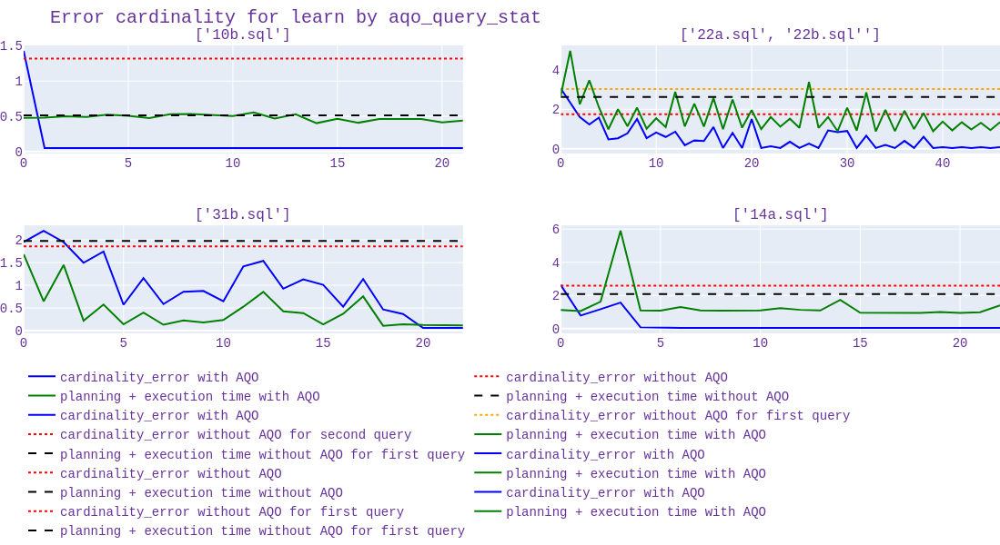

In [235]:
fig = make_subplots(rows=2, cols=2, subplot_titles=["['10b.sql']",
  "['22a.sql', '22b.sql'']", "['31b.sql']",
 "['14a.sql']"])
#for it, i in enumerate(filter1):
df_temp=learn_df_query_stat[learn_df_query_stat['query_name']=="['10b.sql']"]
ox=list(x for x in range(22))
fig.add_trace(
    go.Scatter(name='cardinality_error with AQO'.format("['21a.sql']"),x = ox, y = df_temp['cardinality_error_with_aqo_split'].to_list()[0][:-1], 
               line = dict(color= 'blue', dash='solid')),
    row=1, col=1
)

#fig.update_yaxes(zeroline=True, zerolinewidth=3, zerolinecolor='red')
fig.add_trace(go.Scatter(name='cardinality_error without AQO'.format("['21a.sql']"), x = ox, 
                         y = [df_temp['cardinality_error_without_aqo_split'].to_list()[0][0]]*len(ox), line = dict(color= 'red', dash='dot')), 
              row=1, col=1)

fig.add_trace(
    go.Scatter(name='planning + execution time with AQO'.format(i),x = ox, 
               y = df_temp['execution_time_with_aqo_split'].to_list()[0][:-1]+df_temp['planning_time_with_aqo_split'].to_list()[0][:-1],line = dict(color= 'green', dash='solid')),
    row=1, col=1
)
fig.add_trace(
    go.Scatter(name='planning + execution time without AQO'.format(i),x = ox, 
               y = [df_temp['execution_time_without_aqo_split'].to_list()[0][0]+df_temp['planning_time_without_aqo_split'].to_list()[0][0]]*len(ox),
               line = dict(color= 'black', dash='dash')),
    row=1, col=1
)

#fig.add_trace(go.Scatter(x = ox, y = val_control/val_control*2))

df_temp=learn_df_query_stat[learn_df_query_stat['query_name']=="['22a.sql', '22b.sql']"]
ox=list(x for x in range(len(df_temp['cardinality_error_with_aqo_split'].to_list()[0][:-1])))
fig.add_trace(
    go.Scatter(name='cardinality_error with AQO',x = ox, 
               y = df_temp['cardinality_error_with_aqo_split'].to_list()[0][:-1],
              line = dict(color= 'blue', dash='solid')),
    row=1, col=2
)
#fig.update_yaxes(zeroline=True, zerolinewidth=3, zerolinecolor='red')
fig.add_trace(go.Scatter(name='cardinality_error without AQO for first query'.format("['32a.sql', '32b.sql']"), x = ox, 
                         y = [df_temp['cardinality_error_without_aqo_split'].to_list()[0][0]]*len(ox), line = dict(color= 'orange', dash='dot')),
              row=1, col=2)
fig.add_trace(go.Scatter(name='cardinality_error without AQO for second query'.format("['32a.sql', '32b.sql']"), x = ox, 
                         y = [df_temp['cardinality_error_without_aqo_split'].to_list()[0][1]]*len(ox),line = dict(color= 'red', dash='dot')), 
              row=1, col=2)
fig.add_trace(
    go.Scatter(name='planning + execution time with AQO'.format(i),x = ox, 
               y = df_temp['execution_time_with_aqo_split'].to_list()[0][:-1]+df_temp['planning_time_with_aqo_split'].to_list()[0][:-1], line = dict(color= 'green', dash='solid')),
    row=1, col=2
)
fig.add_trace(
    go.Scatter(name='planning + execution time without AQO for first query'.format(i),x = ox, 
               y = [df_temp['execution_time_without_aqo_split'].to_list()[0][0]+df_temp['planning_time_without_aqo_split'].to_list()[0][0]]*len(ox), line = dict(color= 'black', dash='dash')),
    row=1, col=2
)
#fig.add_trace(
#    go.Scatter(name='planning + execution time without AQO for second query'.format(i),x = ox, 
#               y = [df_temp['execution_time_without_aqo_split'].to_list()[0][1]+df_temp['planning_time_without_aqo_split'].to_list()[0][1]]*len(ox),line = dict(color= 'brown', dash='dash')),
#    row=1, col=2
#)

#fig.add_trace(go.Scatter(x = ox, y = val_control/val_control*2))

df_temp=learn_df_query_stat[learn_df_query_stat['query_name']=="['31b.sql']"]
ox=list(x for x in range(len(df_temp['cardinality_error_with_aqo_split'].to_list()[0][:-1])))
fig.add_trace(
    go.Scatter(name='cardinality_error with AQO',x = ox, y = df_temp['cardinality_error_with_aqo_split'].to_list()[0][:-1],
    line = dict(color= 'blue', dash='solid')),
    row=2, col=1
)

#fig.update_yaxes(zeroline=True, zerolinewidth=3, zerolinecolor='red')
fig.add_trace(go.Scatter(name='cardinality_error without AQO'.format("['31b.sql']"), x = ox, 
                         y = [df_temp['cardinality_error_without_aqo_split'].to_list()[0][0]]*len(ox),line = dict(color= 'red', dash='dot')), 
              row=2, col=1)
fig.add_trace(go.Scatter(name='planning + execution time with AQO'.format(i),x = ox, 
               y = df_temp['execution_time_with_aqo_split'].to_list()[0][:-1]+df_temp['planning_time_with_aqo_split'].to_list()[0][:-1], line = dict(color= 'green', dash='solid')), row=2, col=1
)
fig.add_trace(
    go.Scatter(name='planning + execution time without AQO'.format(i),x = ox, 
               y = [df_temp['execution_time_without_aqo_split'].to_list()[0][0]+df_temp['planning_time_without_aqo_split'].to_list()[0][0]]*len(ox),
               line = dict(color= 'black', dash='dash')),
    row=2, col=1
)
#fig.add_trace(go.Scatter(x = ox, y = val_control/val_control*2))


df_temp=learn_df_query_stat[learn_df_query_stat['query_name']=="['14a.sql']"]
ox=list(x for x in range(len(df_temp['cardinality_error_with_aqo_split'].to_list()[0][:-1])))
fig.add_trace(
    go.Scatter(name='cardinality_error with AQO', x = ox, 
               y = df_temp['cardinality_error_with_aqo_split'].to_list()[0][:-1],
    line = dict(color= 'blue', dash='solid')),
    row=2, col=2
)

#fig.update_yaxes(zeroline=True, zerolinewidth=3, zerolinecolor='red')
fig.add_trace(go.Scatter(name='cardinality_error without AQO for first query'.format("['4a.sql', '4b.sql', '4c.sql']"), x = ox, 
                         y = [df_temp['cardinality_error_without_aqo_split'].to_list()[0][0]]*len(ox),line = dict(color= 'red', dash='dot')), row=2, col=2)
#fig.add_trace(go.Scatter(name='cardinality_error without AQO for second query'.format("['22a.sql', '22b.sql']"), x = ox, 
#                         y = [df_temp['cardinality_error_without_aqo_split'].to_list()[0][1]]*len(ox),line = dict(color= 'orange', dash='dot')), 
#              row=2, col=2)
fig.add_trace(go.Scatter(name='planning + execution time with AQO'.format(i),x = ox, 
                         y = df_temp['execution_time_with_aqo_split'].to_list()[0][:-1]+df_temp['planning_time_with_aqo_split'].to_list()[0][:-1], line = dict(color= 'green', dash='solid')), row=2, col=2
)
fig.add_trace(go.Scatter(name='planning + execution time without AQO for first query'.format(i),x = ox, 
                         y = [df_temp['execution_time_without_aqo_split'].to_list()[0][0]+df_temp['planning_time_without_aqo_split'].to_list()[0][0]]*len(ox),
                         line = dict(color= 'black', dash='dash')), row=2, col=2
)
#fig.add_trace(go.Scatter(name='planning + execution time without AQO for second query'.format(i),x = ox, 
#                         y = [df_temp['execution_time_without_aqo_split'].to_list()[0][1]+df_temp['planning_time_without_aqo_split'].to_list()[0][1]]*len(ox),
#                         line = dict(color= 'brown', dash='dash')),row=2, col=2
#)
#fig.add_trace(go.Scatter(x = ox, y = val_control/val_control*2))
fig.update_layout(title_text="Error cardinality for learn by aqo_query_stat",
              margin=dict(l=0, r=0, t=50, b=0),font=dict(
    family="Courier New, monospace",
    size=14,
    color="RebeccaPurple"
),legend=dict(
orientation="h"
))

fig.update_layout(width=1600, height = 600)
upload_pics(fig, '{}/{}_folder{}'.format(main_path, 'learn',cycle_test), 'Error cardinality for learn by aqo_query_stat')
os.rename('temp-plot.html', '{}_Error cardinality for learn by aqo_query_stat.html'.format(cycle_test))
fig.show()

Found ffmpeg: /opt/yandex/browser-beta/libffmpeg.so
	avcodec: 3877988
	avformat: 3874916
	avutil: 3744870
Ffmpeg version is OK! Let's use it.
[58652:58652:0402/212249.537149:ERROR:isolated_origin_util.cc(74)] Ignoring port number in isolated origin: chrome://custo


Opening in existing browser session.


libva error: vaGetDriverNameByIndex() failed with unknown libva error, driver_name = (null)


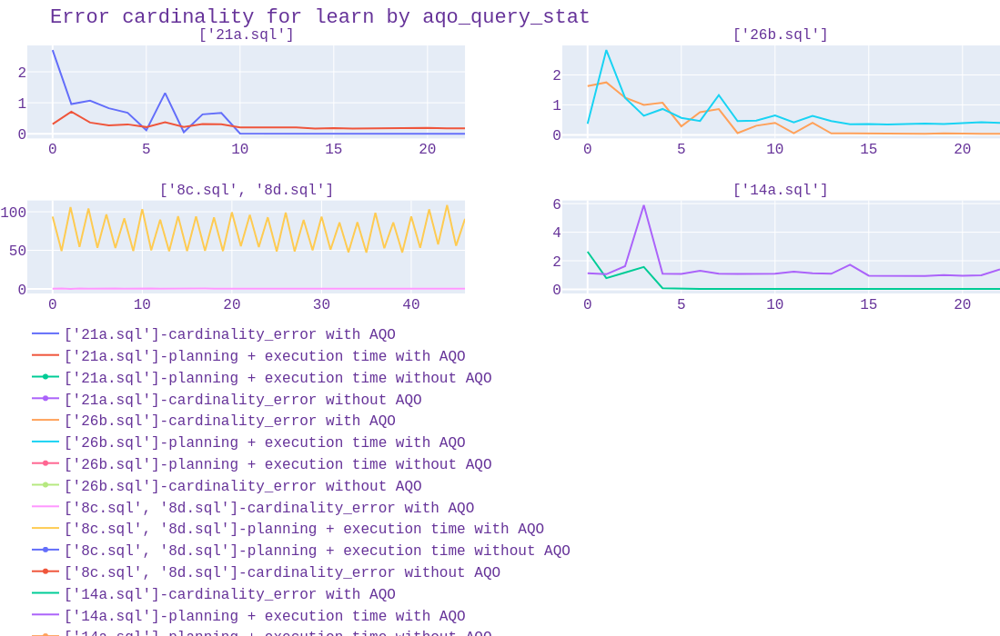

In [196]:
fig = make_subplots(rows=2, cols=2, subplot_titles=filter1)
for it, i in enumerate(filter1):
    df_temp=learn_df_query_stat[learn_df_query_stat['query_name']==i]
    ox=list(x for x in range(len(df_temp['cardinality_error_with_aqo_split'].to_list()[0][:-1])))
    fig.add_trace(
        go.Scatter(name='{}-cardinality_error with AQO'.format(i),x = ox, y = df_temp['cardinality_error_with_aqo_split'].to_list()[0][:-1]),
        row=(it//2)+1, col=(it%2)+1
    )
    fig.add_trace(
        go.Scatter(name='{}-planning + execution time with AQO'.format(i),x = ox, y = df_temp['execution_time_with_aqo_split'].to_list()[0][:-1]+df_temp['planning_time_with_aqo_split'].to_list()[0][:20]),
        row=(it//2)+1, col=(it%2)+1
    )
    fig.add_trace(
        go.Scatter(name='{}-planning + execution time without AQO'.format(i),x = ox, y = [df_temp['execution_time_without_aqo_split'].to_list()[0][:]+df_temp['planning_time_without_aqo_split'].to_list()[0][:]]*len(ox)),
        row=(it//2)+1, col=(it%2)+1
    )
    fig.add_trace(go.Scatter(name='{}-cardinality_error without AQO'.format(i), x = ox, y = [df_temp['cardinality_error_without_aqo_split'].to_list()[0][:]]*len(ox)), 
                  row=(it//2)+1, col=(it%2)+1)
    #fig.update_yaxes(zeroline=True, zerolinewidth=3, zerolinecolor='red')
    #fig.add_trace(go.Scatter(x = ox, y = val_control/val_control))
    #fig.add_trace(go.Scatter(x = ox, y = val_control/val_control*2))
fig.update_layout(title_text="Error cardinality for learn by aqo_query_stat",
                  margin=dict(l=0, r=0, t=50, b=0))
fig.update_layout(width=1300, height = 700,font=dict(
        family="Courier New, monospace",
        size=16,
        color="RebeccaPurple"
    ),
                 legend=dict(
    orientation="h"
))
upload_pics(fig, '{}/{}_folder{}'.format(main_path, 'learn',cycle_test), 'Error cardinality for learn by aqo_query_stat')
os.rename('temp-plot.html', '{}_Error cardinality for learn by aqo_query_stat.html'.format(cycle_test))
fig.show()

## execution for every query

### learn_df_ex_pl_time_orig

In [73]:
name_query = list(learn_df_query_err['query_name'].unique())

In [74]:
ox=list(x for x in range(times))

Found ffmpeg: /opt/yandex/browser-beta/libffmpeg.so
	avcodec: 3877988
	avformat: 3874916
	avutil: 3744870
Ffmpeg version is OK! Let's use it.
[7636:7636:0403/164800.020514:ERROR:isolated_origin_util.cc(74)] Ignoring port number in isolated origin: chrome://custo


Opening in existing browser session.


libva error: vaGetDriverNameByIndex() failed with unknown libva error, driver_name = (null)


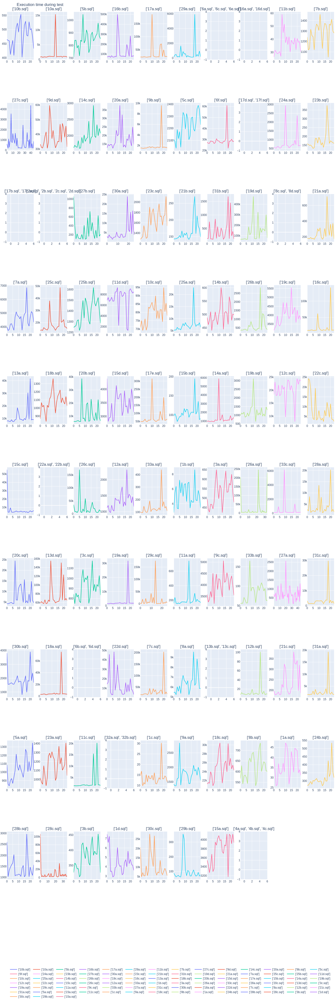

In [76]:
fig = make_subplots(rows=10, cols=10, subplot_titles=name_query)
for it, i in enumerate(name_query):
    df_temp=learn_df_ex_pl_time_orig[learn_df_ex_pl_time_orig['query_name']==i[2:-2]]
    fig.add_trace(
        go.Scatter(name=i,x = ox, y = df_temp['execution_time']),
        row=(it//10)+1, col=(it%10)+1
    )
    #fig.update_yaxes(zeroline=True, zerolinewidth=3, zerolinecolor='red')
    #fig.add_trace(go.Scatter(x = ox, y = val_control/val_control))
    #fig.add_trace(go.Scatter(x = ox, y = val_control/val_control*2))
fig.update_layout(legend_orientation="h",
                  title_text="Execution time during test",
                  legend=dict(x=.5, xanchor="center"),
                  margin=dict(l=0, r=0, t=50, b=0))
fig.update_layout(width=4000, height = 4200)
upload_pics(fig, '{}/{}_folder{}'.format(main_path, 'learn',cycle_test), 'Execution time during test')
os.rename('temp-plot.html', '{}_Execution time during test.html'.format(cycle_test))
fig.show()

### learn_df_query_stat

In [77]:
name_query=list(learn_df_query_stat['query_name'])

In [78]:
df_temp=learn_df_query_stat[learn_df_query_stat['query_name']=="['15a.sql']"]

In [79]:
ox=list(x for x in range(len(df_temp['execution_time_with_aqo_split'].to_list()[0])))

Found ffmpeg: /opt/yandex/browser-beta/libffmpeg.so
	avcodec: 3877988
	avformat: 3874916
	avutil: 3744870
Ffmpeg version is OK! Let's use it.
[1163576:1163576:0331/215515.144971:ERROR:isolated_origin_util.cc(74)] Ignoring port number in isolated origin: chrome://custo


Opening in existing browser session.


libva error: vaGetDriverNameByIndex() failed with unknown libva error, driver_name = (null)


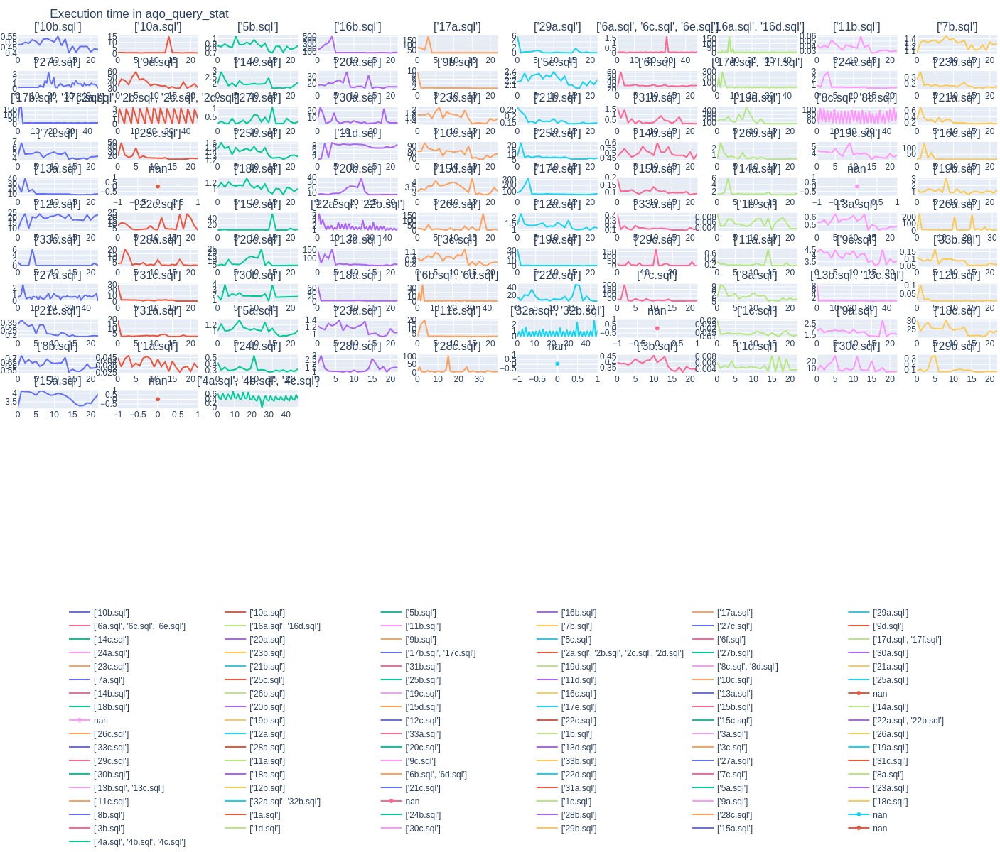

In [61]:
fig = make_subplots(rows=15, cols=10, subplot_titles=name_query)
for it, i in enumerate(name_query):
    df_temp=learn_df_query_stat[learn_df_query_stat['query_name']==i]
    ox=list(x for x in range(len(df_temp['execution_time_with_aqo_split'].to_list()[0][:-1])))
    fig.add_trace(
        go.Scatter(name=i,x = ox, y = df_temp['execution_time_with_aqo_split'].to_list()[0][:-1]),
        row=(it//10)+1, col=(it%10)+1
    )
    #fig.update_yaxes(zeroline=True, zerolinewidth=3, zerolinecolor='red')
    #fig.add_trace(go.Scatter(x = ox, y = val_control/val_control))
    #fig.add_trace(go.Scatter(x = ox, y = val_control/val_control*2))
fig.update_layout(legend_orientation="h",
                  title_text="Execution time in aqo_query_stat",
                  legend=dict(x=.5, xanchor="center"),
                  margin=dict(l=0, r=0, t=50, b=0))
fig.update_layout(width=3000, height = 1200)
upload_pics(fig, '{}/{}_folder{}'.format(main_path, 'learn',cycle_test), 'Execution time in aqo_query_stat')
os.rename('temp-plot.html', '{}_Execution time in aqo_query_stat.html'.format(cycle_test))
fig.show()

## plan for every query

### learn_df_ex_pl_time_orig

In [62]:
name_query = list(learn_df_query_err['query_name'].unique())

In [63]:
ox=list(x for x in range(times))

Found ffmpeg: /opt/yandex/browser-beta/libffmpeg.so
	avcodec: 3877988
	avformat: 3874916
	avutil: 3744870
Ffmpeg version is OK! Let's use it.
[1163713:1163713:0331/215528.207638:ERROR:isolated_origin_util.cc(74)] Ignoring port number in isolated origin: chrome://custo


Opening in existing browser session.


libva error: vaGetDriverNameByIndex() failed with unknown libva error, driver_name = (null)


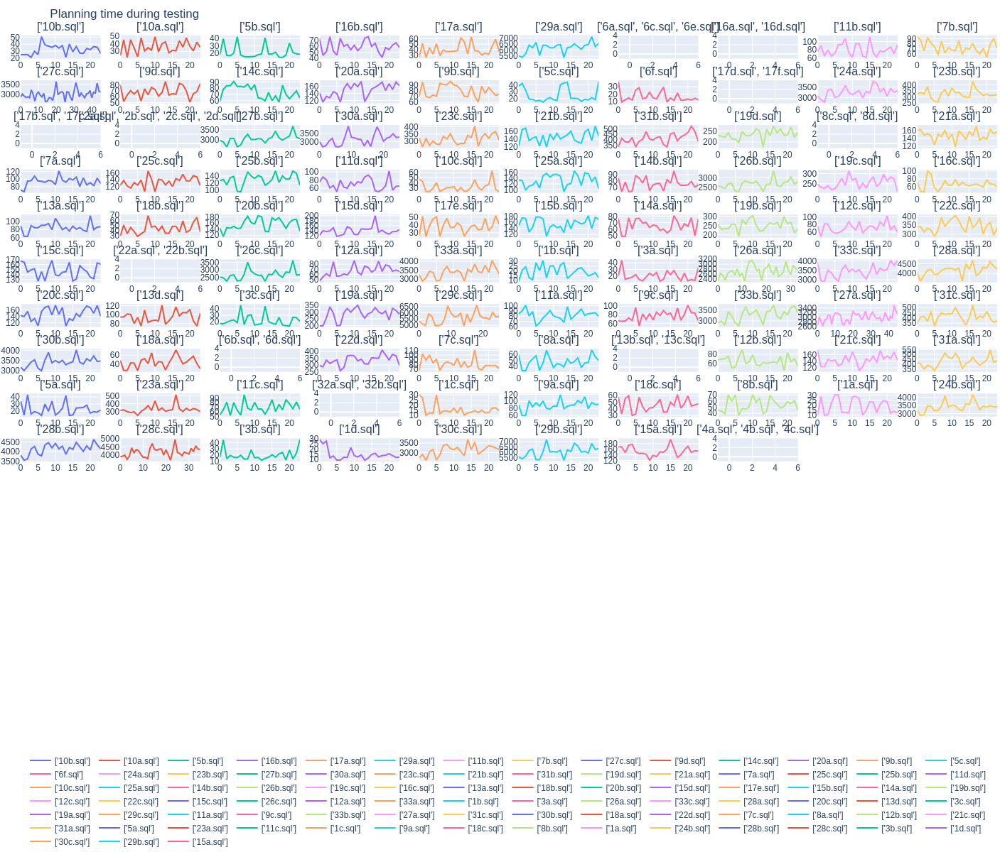

In [64]:
fig = make_subplots(rows=15, cols=10, subplot_titles=name_query)
for it, i in enumerate(name_query):
    df_temp=learn_df_ex_pl_time_orig[learn_df_ex_pl_time_orig['query_name']==i[2:-2]]
    fig.add_trace(
        go.Scatter(name=i,x = ox, y = df_temp['plan_time']),
        row=(it//10)+1, col=(it%10)+1
    )
    #fig.update_yaxes(zeroline=True, zerolinewidth=3, zerolinecolor='red')
    #fig.add_trace(go.Scatter(x = ox, y = val_control/val_control))
    #fig.add_trace(go.Scatter(x = ox, y = val_control/val_control*2))
fig.update_layout(legend_orientation="h",
                  title='Planning time during testing',
                  legend=dict(x=.5, xanchor="center"),
                  margin=dict(l=0, r=0, t=50, b=0))
fig.update_layout(width=3000, height = 1200)
upload_pics(fig, '{}/{}_folder{}'.format(main_path, 'learn',cycle_test), 'Planning time during testing')
os.rename('temp-plot.html', '{}_Planning time during testing.html'.format(cycle_test))
fig.show()

### aqo_query_stat

In [65]:
name_query=list(learn_df_query_stat['query_name'])

Found ffmpeg: /opt/yandex/browser-beta/libffmpeg.so
	avcodec: 3877988
	avformat: 3874916
	avutil: 3744870
Ffmpeg version is OK! Let's use it.
[1163845:1163845:0331/215541.038325:ERROR:isolated_origin_util.cc(74)] Ignoring port number in isolated origin: chrome://custo


Opening in existing browser session.


libva error: vaGetDriverNameByIndex() failed with unknown libva error, driver_name = (null)


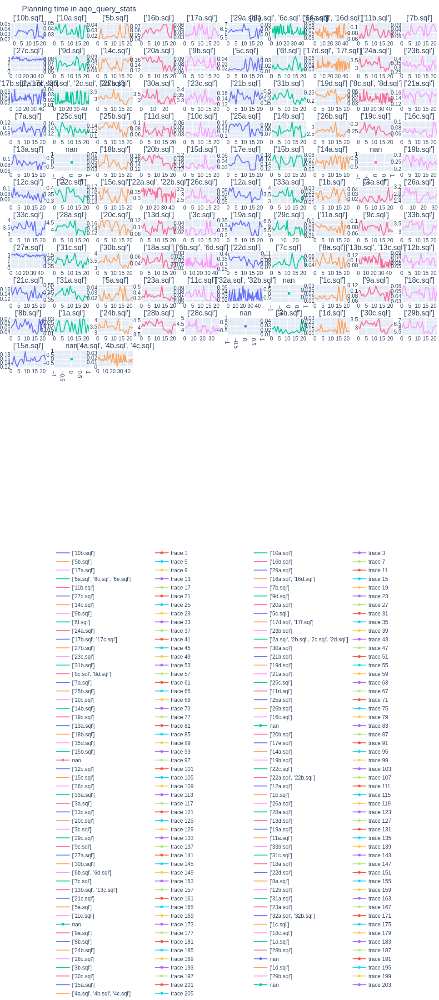

In [66]:
fig = make_subplots(rows=15, cols=10, subplot_titles=name_query)
for it, i in enumerate(name_query):
    df_temp=learn_df_query_stat[learn_df_query_stat['query_name']==i]
    ox=list(x for x in range(len(df_temp['planning_time_with_aqo_split'].to_list()[0][:-1])))
    fig.add_trace(
        go.Scatter(name='{}-planning+execution time with aqo'.format(i),x = ox, y = df_temp['planning_time_with_aqo_split'].to_list()[0][:-1]),
        row=(it//10)+1, col=(it%10)+1
    )
    fig.add_trace(go.Scatter(name='{}-planning+execution time without aqo'.format(i),x = ox, y = df_temp['planning_time_without_aqo_split'])
    )
    #fig.update_yaxes(zeroline=True, zerolinewidth=3, zerolinecolor='red')
    #fig.add_trace(go.Scatter(x = ox, y = val_control/val_control))
    #fig.add_trace(go.Scatter(x = ox, y = val_control/val_control*2))
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  title='Planning time in aqo_query_stats',
                  margin=dict(l=0, r=0, t=50, b=0))
fig.update_layout(width=4000, height = 2200)
upload_pics(fig, '{}/{}_folder{}'.format(main_path, 'learn',cycle_test), 'Planning time in aqo_query_stats')
os.rename('temp-plot.html', '{}_Planning time in aqo_query_stats.html'.format(cycle_test))
fig.show()

# build graphs: disabled and control

## query with plan and execution time

### df_ex_pl_time

In [81]:
df_ex_pl_time_copy=df_ex_pl_time.copy()

In [82]:
df_ex_pl_time_copy

,query_number,query_name,execution_time_frozen,plan_time_frozen,query_hash,execution_time_disabled,plan_time_disabled
0,1,10a.sql,2931.512,81.797,-6651533820180303979,15198.434,39.117
1,1,10b.sql,168.724,37.061,988535410010893112,482.565,29.349
2,1,10c.sql,22081.529,20.822,2494719406442254794,104833.564,16.746
3,1,11a.sql,162.339,94.055,-8754961486292191806,916.808,44.947
4,1,11b.sql,77.445,90.067,7102013096890644952,43.559,30.234
...,...,...,...,...,...,...,...
108,1,8d.sql,10429.983,26.912,-2444720784039749802,49745.081,36.351
109,1,9a.sql,5907.466,63.055,-6747521538659772949,1930.817,52.099
110,1,9b.sql,2125.800,70.650,316739818532851506,10750.612,27.837
111,1,9c.sql,974.750,60.683,-180252288200201541,4177.950,36.404


In [89]:
df_ex_pl_time_copy['diff_exec_time']=df_ex_pl_time_copy['execution_time_disabled']-df_ex_pl_time_copy['execution_time_frozen']

In [90]:
frozen_df_query_stat['rate_exec_time']=frozen_df_query_stat['lst_min_exec_without_aqo']/frozen_df_query_stat['lst_min_exec_with_aqo']

In [91]:
df_ex_pl_time_copy['diff_plan_time']=df_ex_pl_time_copy['plan_time_disabled']-df_ex_pl_time_copy['plan_time_frozen']

In [92]:
frozen_df_query_stat['rate_plan_time']=frozen_df_query_stat['lst_min_plan_without_aqo']/frozen_df_query_stat['lst_min_plan_with_aqo']

In [93]:
frozen_df_query_stat.columns

Index(['queryid', 'cardinality_error_without_aqo_split',
       'cardinality_error_with_aqo_split', 'planning_time_without_aqo_split',
       'planning_time_with_aqo_split', 'execution_time_without_aqo_split',
       'execution_time_with_aqo_split', 'executions_with_aqo',
       'executions_without_aqo', 'min_iter_card_with', 'lst_min_val_with_aqo',
       'min_iter_card_without', 'lst_min_val_without_aqo',
       'min_iter_exec_with', 'lst_min_exec_with_aqo',
       'cardinality_error_without_aqo_split_last_value',
       'cardinality_error_with_aqo_split_last_value', 'query_name',
       'lst_min_exec_without_aqo', 'lst_min_plan_without_aqo',
       'lst_min_plan_with_aqo', 'rate_exec_time', 'rate_plan_time'],
      dtype='object')

In [85]:
frozen_df_query_stat['lst_min_exec_without_aqo']= min(frozen_df_query_stat['execution_time_without_aqo_split'][0])
frozen_df_query_stat['lst_min_plan_without_aqo']= min(frozen_df_query_stat['planning_time_without_aqo_split'][0])
frozen_df_query_stat['lst_min_exec_with_aqo']= min(frozen_df_query_stat['execution_time_with_aqo_split'][0])
frozen_df_query_stat['lst_min_plan_with_aqo']= min(frozen_df_query_stat['planning_time_with_aqo_split'][0])
frozen_df_query_stat['lst_min_val_with_aqo']= min(frozen_df_query_stat['cardinality_error_with_aqo_split'][0])
frozen_df_query_stat['lst_min_val_without_aqo']= min(frozen_df_query_stat['cardinality_error_without_aqo_split'][0])
#for i in frozen_df_query_stat.itertuples(index=False):

In [86]:
exec_with=[]
exec_without=[]
plan_with=[]
plan_without=[]
err_with=[]
err_without=[]
for i in frozen_df_query_stat.itertuples(index=False):
    exec_without.append(i.execution_time_without_aqo_split[0])
    plan_without.append(i.planning_time_without_aqo_split[0])
    exec_with.append(min(i.execution_time_with_aqo_split))
    plan_with.append(min(i.planning_time_with_aqo_split))
    err_without.append(i.cardinality_error_without_aqo_split[0])
    err_with.append(min(i.cardinality_error_with_aqo_split))

In [87]:
frozen_df_query_stat['lst_min_exec_without_aqo']=exec_without
frozen_df_query_stat['lst_min_exec_with_aqo']=exec_with
frozen_df_query_stat['lst_min_plan_without_aqo']=plan_without
frozen_df_query_stat['lst_min_plan_with_aqo']=plan_with
frozen_df_query_stat['lst_min_val_with_aqo']=err_with
frozen_df_query_stat['lst_min_val_without_aqo']=err_without

In [109]:
frozen_df_query_stat1=frozen_df_query_stat[(frozen_df_query_stat['lst_min_exec_without_aqo']>=2) & (frozen_df_query_stat['lst_min_exec_without_aqo']>=20)]

In [90]:
frozen_df_query_stat1=frozen_df_query_stat[frozen_df_query_stat['lst_min_exec_with_aqo']+frozen_df_query_stat['lst_min_plan_with_aqo']>=0.5]

In [91]:
frozen_df_query_stat1=frozen_df_query_stat

Found ffmpeg: /opt/yandex/browser-beta/libffmpeg.so
	avcodec: 3877988
	avformat: 3874916
	avutil: 3744870
Ffmpeg version is OK! Let's use it.
[32370:32370:0402/161235.679752:ERROR:isolated_origin_util.cc(74)] Ignoring port number in isolated origin: chrome://custo
libva error: vaGetDriverNameByIndex() failed with unknown libva error, driver_name = (null)


Opening in existing browser session.


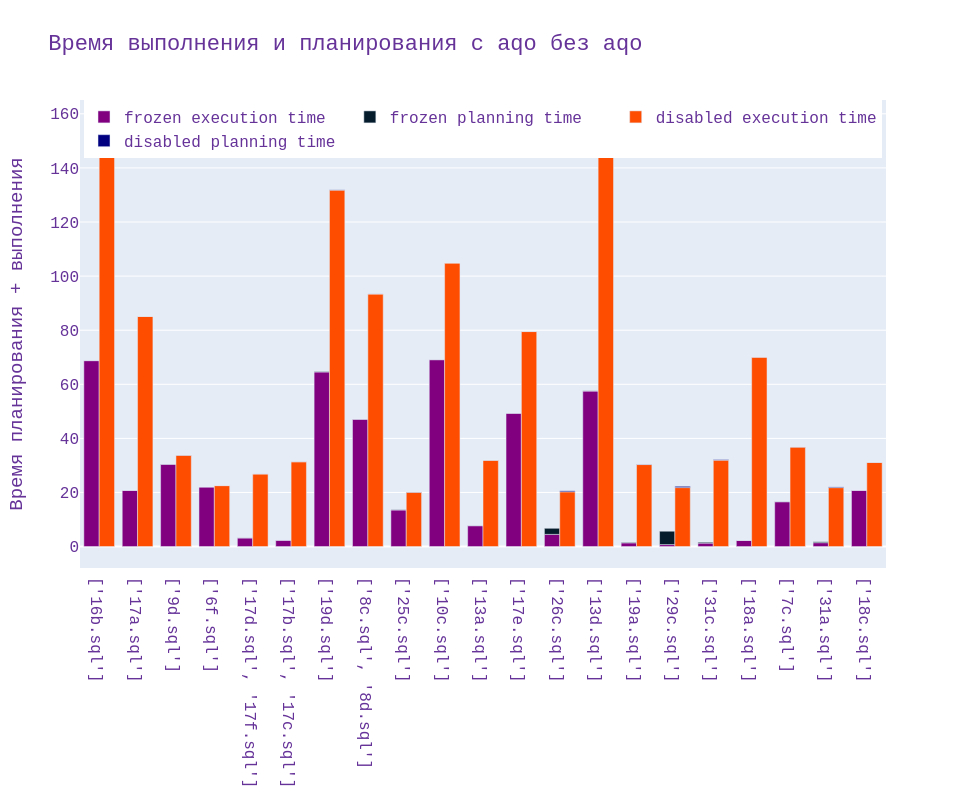

In [110]:
stackData = {
    "last execution time with aqo":frozen_df_query_stat1['lst_min_exec_with_aqo'],
    "last execution time without aqo": frozen_df_query_stat1['lst_min_exec_without_aqo'],
    # Use differece
    "last planning time without aqo": frozen_df_query_stat1['lst_min_plan_without_aqo'],
    "last planning time with aqo":frozen_df_query_stat1['lst_min_plan_with_aqo'],
    "labels": frozen_df_query_stat1[frozen_df_query_stat1['query_name']!='nan']['query_name']
}


fig3 = go.Figure(
    data=[
        go.Bar(
            name="frozen execution time",
            x=stackData["labels"],
            y=stackData["last execution time with aqo"],
            offsetgroup=0,
            marker_color = '#800080'
        ),
        go.Bar(
            name="frozen planning time",
            x=stackData["labels"],
            y=stackData["last planning time with aqo"],
            offsetgroup=0,
            base=stackData["last execution time with aqo"],
            marker_color = '#051c2c'
        ),
        go.Bar(
            name="disabled execution time",
            x=stackData["labels"],
            y=stackData["last execution time without aqo"],
            offsetgroup=1,
            marker_color = '#ff4d00'
        ),
        go.Bar(
            name="disabled planning time",
            x=stackData["labels"],
            y=stackData["last planning time without aqo"],
            offsetgroup=1,
            base=stackData["last execution time without aqo"],
            marker_color = '#000080'
        )
    ],
    layout=go.Layout(
        title="Время выполнения и планирования с aqo без aqo",
        yaxis_title="Время планирования + выполнения",
        width=1400, height = 800, font=dict(
        family="Courier New, monospace",
        size=16,
        color="RebeccaPurple"
    ),
                 legend=dict(
    orientation = 'h', xanchor = "center", x = 0.5, y= 1)
    )
)
upload_pics(fig3, '{}/{}_folder{}'.format(main_path, 'learn',cycle_test), 'Stack')
fig3.show()